In [1]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import requests
from io import BytesIO
%matplotlib inline

In [2]:
predict_csv = "/Users/shivamswarnkar/Desktop/recognitionDELF.csv"
train_csv = "/Users/shivamswarnkar/Desktop/train.csv"
test_csv = "/Users/shivamswarnkar/Desktop/test.csv"
SAMPLE_NUM = 10
EXAMPLE_NUM = 5

In [3]:
#making dict of training images, where key is landmark id
#and value is the list of images with same landmark id
train_fh = open(train_csv, 'r')
label_data = {}
for line in train_fh:
    im, url, l_id = line.strip().split(',')
    url = url.split('"')[1].strip()
    if(label_data.get(l_id)):
        label_data[l_id].append(url)
    else:
        label_data[l_id] = [url]

train_fh.close()

In [4]:
test_fh = open(test_csv, 'r')
query_url = {}
test_fh.readline()
for line in test_fh:
    im, url = line.strip().split(',')
    im = im.split('"')[1].strip()
    url = url.split('"')[1].strip()
    query_url[im] = url
test_fh.close()

In [5]:
#making dict of predicted images, where key is query image name
#and value is predicted landmark id
predict_fh = open(predict_csv, 'r')
predict_data = {}
predict_prob = {}  #key is query, value is probability 
predict_fh.readline()
for line in predict_fh:
    im, val = line.strip().split(',')
    im = im.split('"')[0].strip()
    try:
        l_id, prob = val.split()
        predict_data[im] = l_id.strip()
        predict_prob[im] = float(prob)
    except:
        ...
predict_fh.close()

In [6]:
import random

all_query = list(predict_data.keys())
rand_indx = random.randint(0, len(all_query)-SAMPLE_NUM-1)
sample_query = all_query[rand_indx:rand_indx+SAMPLE_NUM]

urls_lst = []

for query in sample_query:
    l_id = predict_data[query]
    urls_lst.append(query_url[query])
    train_urls = label_data[l_id][:EXAMPLE_NUM] 
    urls_lst.extend(train_urls)
   

IndexError: list index out of range

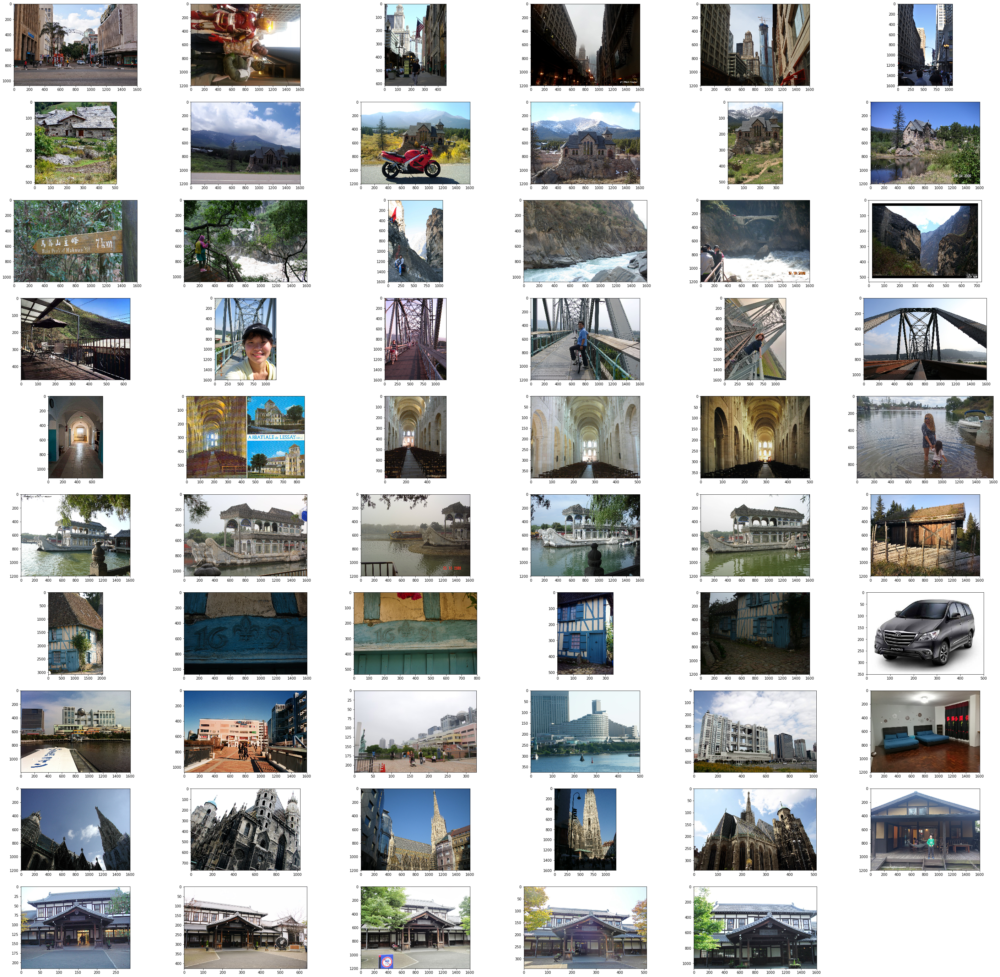

In [7]:
import numpy as np
import matplotlib.pyplot as plt

w=10
h=10
fig=plt.figure(figsize=(50, 50))
columns = EXAMPLE_NUM+1
rows = SAMPLE_NUM
for i in range(1, columns*rows +1):
    response = requests.get(urls_lst[i-1])
    img = Image.open(BytesIO(response.content))
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show()